# Imports

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import scipy.sparse as sp
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
from scipy.linalg import eigh
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, normalized_mutual_info_score
from scipy.spatial.distance import cdist
import pandas as pd
import os

The code imports various libraries such as NetworkX, Matplotlib, and scikit-learn for graph analysis, clustering, and distance calculations. It enables graph creation, clustering, visualization, and similarity computations using tools like cosine similarity and KMeans.

# Loading Datasets

In [2]:
# Folder path where the dataset files are located
folder_path = './dataset'

# List of node IDs
node_ids = [0, 107, 348, 414, 686, 698, 1684, 1912, 3437, 3980]

# Function to load the content of a file
def load_file(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'r') as file:
            content = file.readlines()
        return content
    else:
        print(f"File not found: {file_path}")
        return []

# Store all the data for each node
node_data = {}

# Load data for each node
for node_id in node_ids:
    # Define file paths for each node's data files
    edges_file = os.path.join(folder_path, f"{node_id}.edges")
    circles_file = os.path.join(folder_path, f"{node_id}.circles")
    egofeat_file = os.path.join(folder_path, f"{node_id}.egofeat")
    feat_file = os.path.join(folder_path, f"{node_id}.feat")
    featnames_file = os.path.join(folder_path, f"{node_id}.featnames")
    
    # Load the data for the current node
    edges_data = load_file(edges_file)
    circles_data = load_file(circles_file)
    egofeat_data = load_file(egofeat_file)
    feat_data = load_file(feat_file)
    featnames_data = load_file(featnames_file)
    
    # Store the data in a dictionary
    node_data[node_id] = {
        'edges': edges_data,
        'circles': circles_data,
        'egofeat': egofeat_data,
        'feat': feat_data,
        'featnames': featnames_data
    }

This code loads dataset files for a list of node IDs, where each node has corresponding data files for edges, circles, features, and feature names. It defines a function to read the contents of each file and then iterates over the node IDs, loading the data for each node and storing it in a dictionary.

# Display the network graph

The following code defines a function that creates and displays a network graph for a specific node by loading its edge data and constructing a graph using NetworkX. It then visualizes the subgraph of the first 50 nodes (or fewer if the network has fewer nodes) and prints out key network metrics like the number of nodes, edges, and average clustering coefficient for each node in the list.


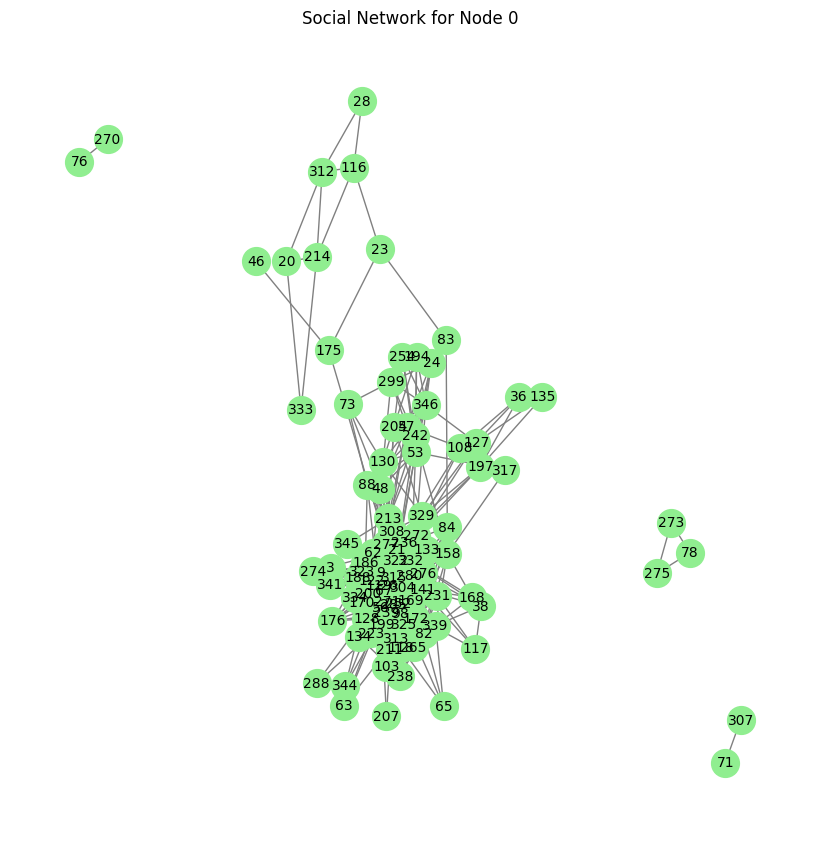

Node 0 Network Metrics:
Number of nodes: 333
Number of edges: 2519
Average Clustering Coefficient: 0.5082
--------------------------------------------------


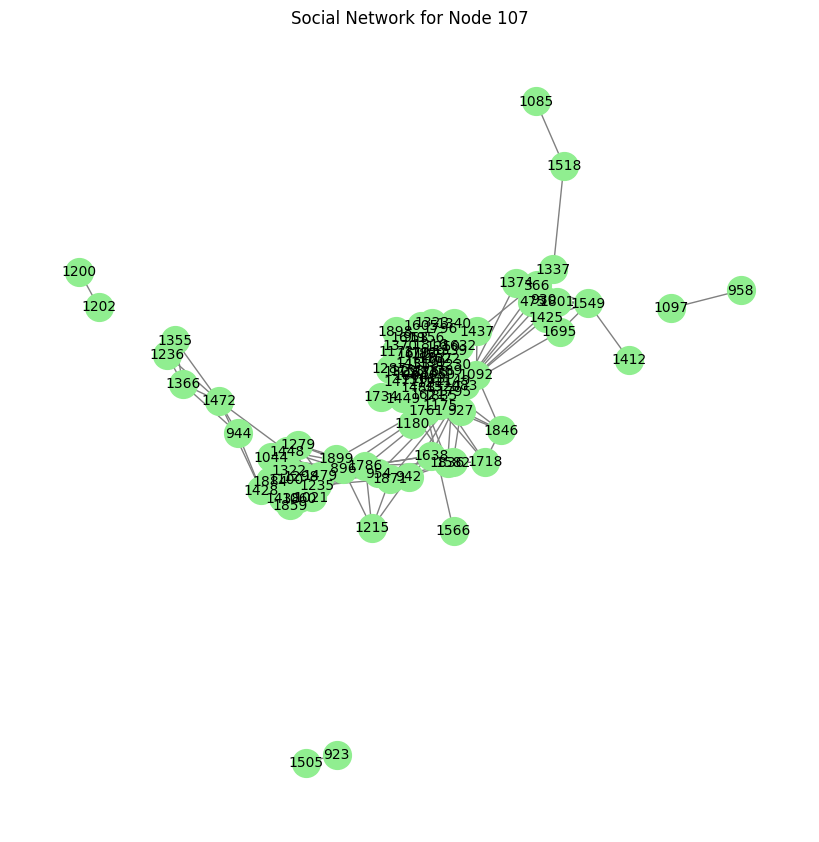

Node 107 Network Metrics:
Number of nodes: 1034
Number of edges: 26749
Average Clustering Coefficient: 0.5264
--------------------------------------------------


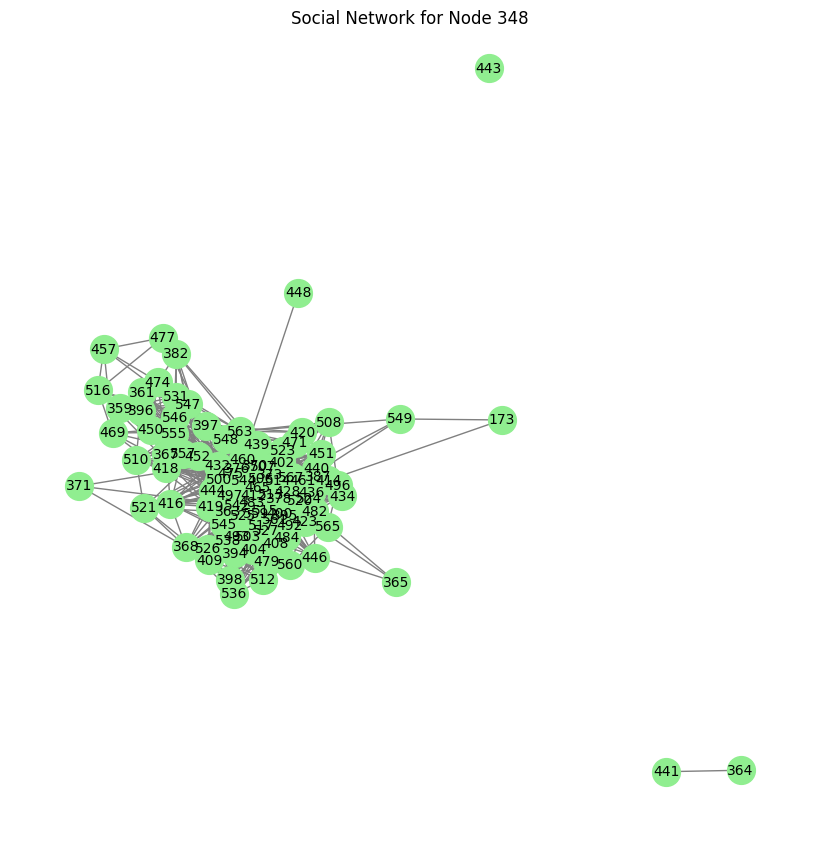

Node 348 Network Metrics:
Number of nodes: 224
Number of edges: 3192
Average Clustering Coefficient: 0.5443
--------------------------------------------------


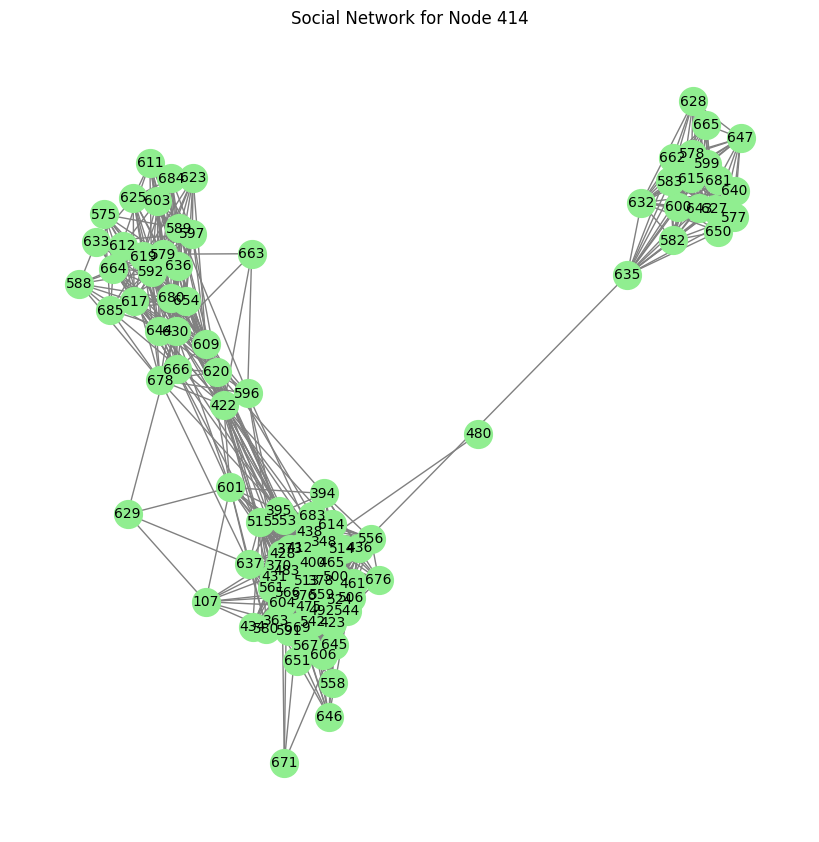

Node 414 Network Metrics:
Number of nodes: 150
Number of edges: 1693
Average Clustering Coefficient: 0.6703
--------------------------------------------------


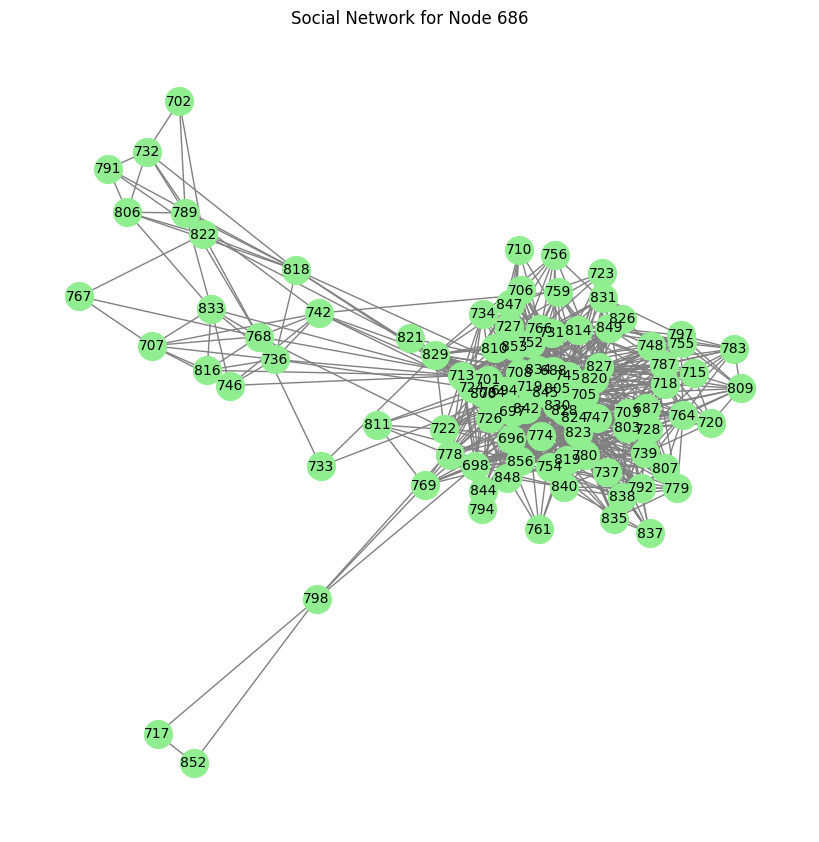

Node 686 Network Metrics:
Number of nodes: 168
Number of edges: 1656
Average Clustering Coefficient: 0.5338
--------------------------------------------------


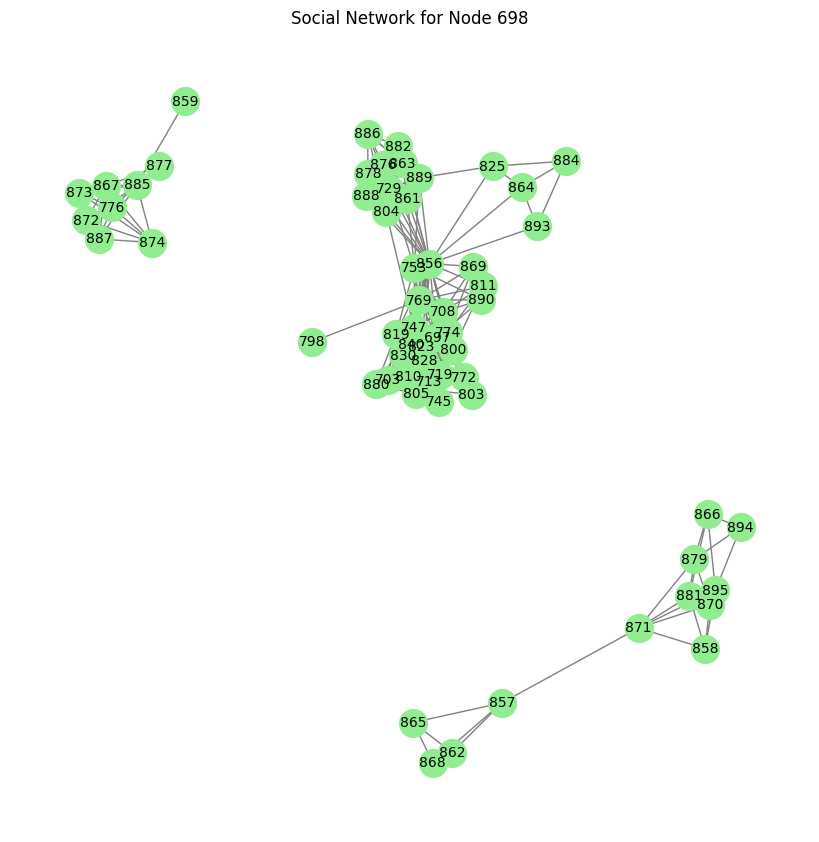

Node 698 Network Metrics:
Number of nodes: 61
Number of edges: 270
Average Clustering Coefficient: 0.7332
--------------------------------------------------


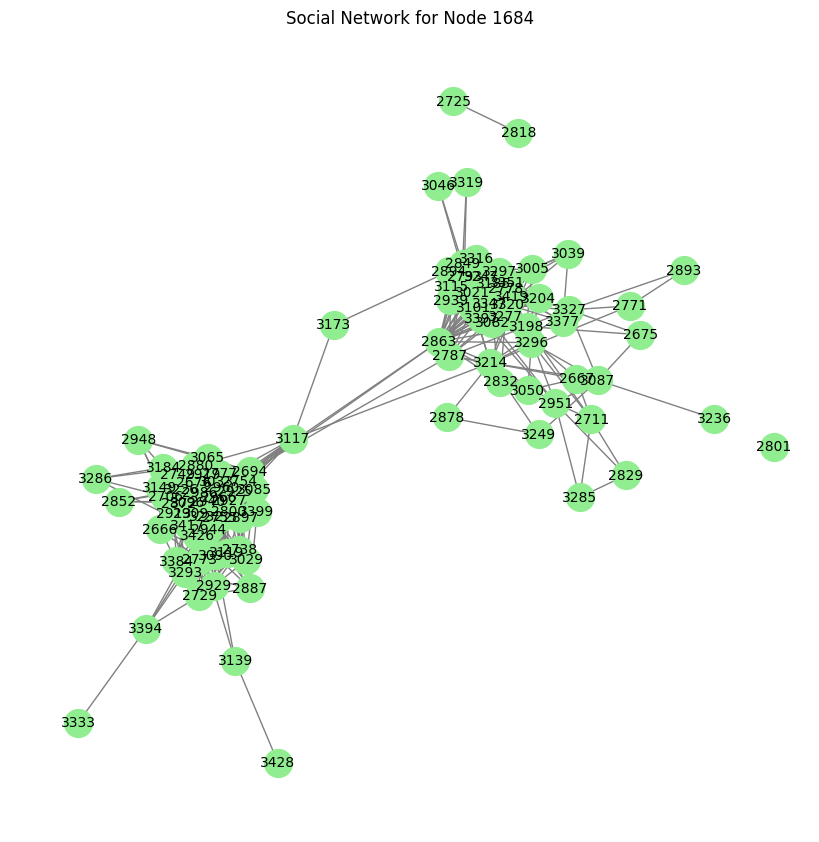

Node 1684 Network Metrics:
Number of nodes: 786
Number of edges: 14024
Average Clustering Coefficient: 0.4757
--------------------------------------------------


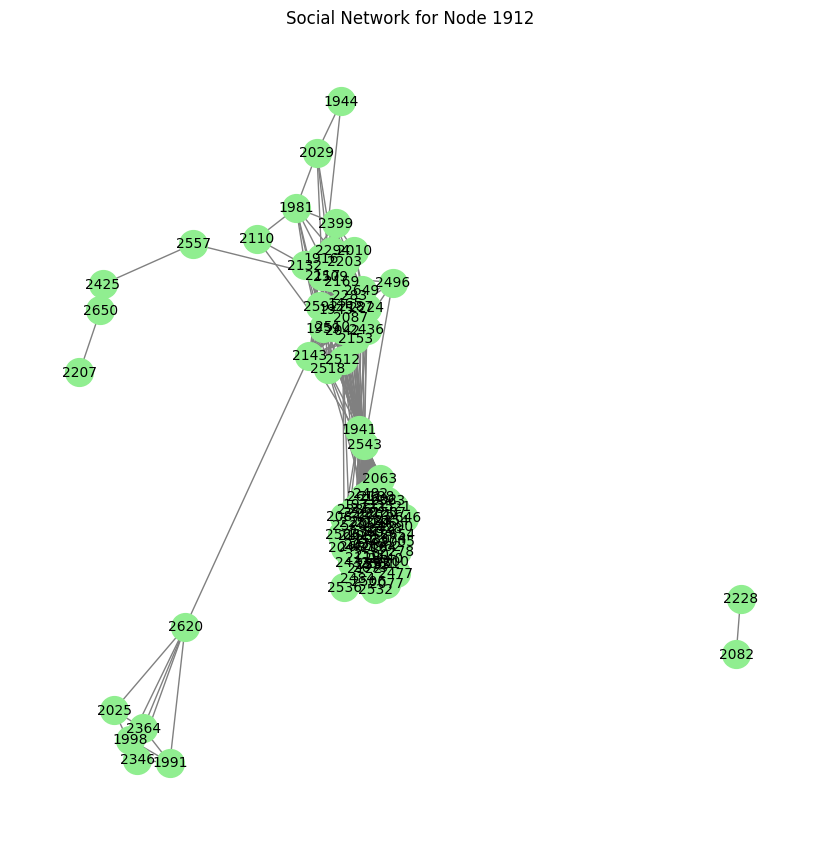

Node 1912 Network Metrics:
Number of nodes: 747
Number of edges: 30025
Average Clustering Coefficient: 0.6354
--------------------------------------------------


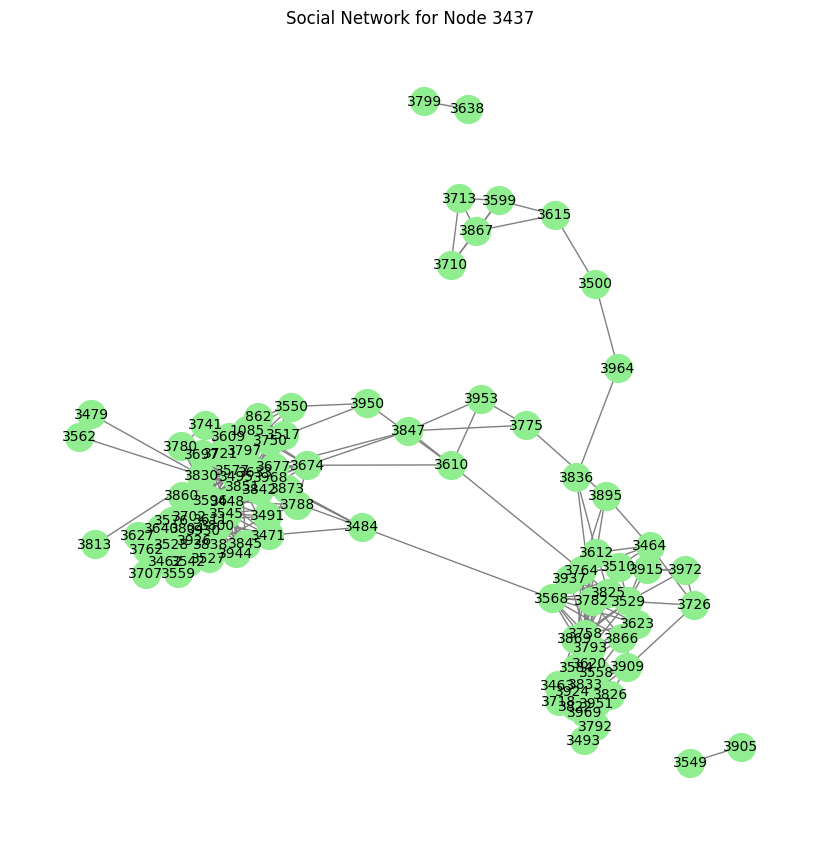

Node 3437 Network Metrics:
Number of nodes: 534
Number of edges: 4813
Average Clustering Coefficient: 0.5437
--------------------------------------------------


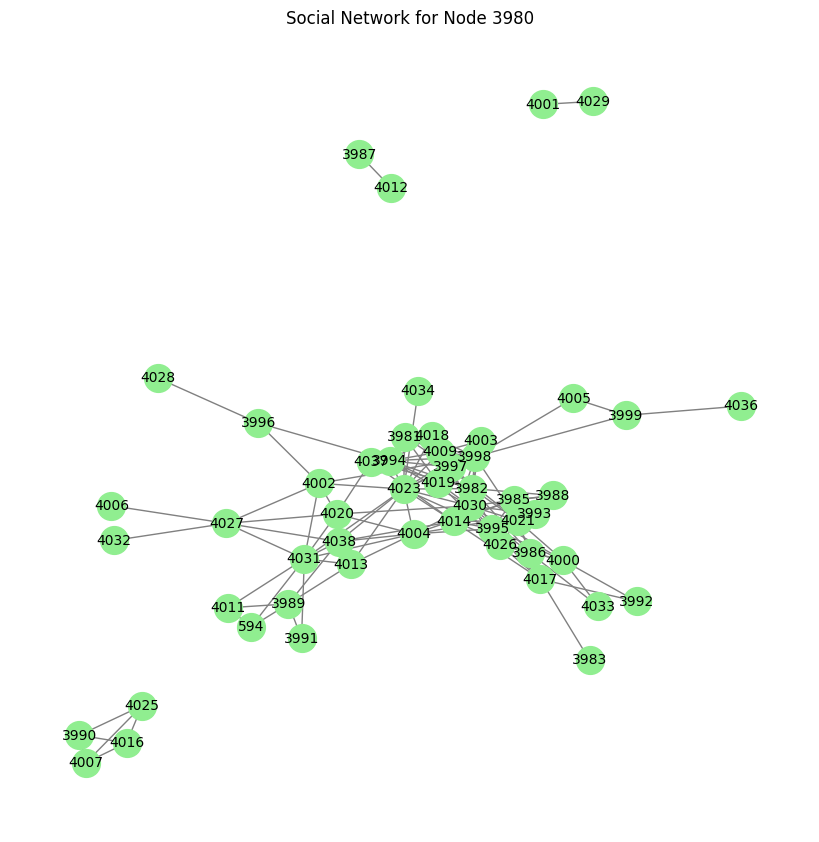

Node 3980 Network Metrics:
Number of nodes: 52
Number of edges: 146
Average Clustering Coefficient: 0.4617
--------------------------------------------------


In [3]:
# Function to create and display the network graph for a node
def display_network_for_node(node_id, node_data):
    # Retrieve the edges data for the current node
    edges_data = node_data[node_id]['edges']
    
    # Create the graph using NetworkX
    G = nx.Graph()
    
    # Parse the edges and add them to the graph
    for edge in edges_data:
        u, v = map(int, edge.split())
        G.add_edge(u, v)
    
    # Display graph for the first 100 nodes (or fewer if the network has fewer nodes)
    nodes_to_display = list(G.nodes)[:100]
    subgraph = G.subgraph(nodes_to_display)
    
    # Section for plotting the network graph
    def plot_graph():
        plt.figure(figsize=(8, 8))
        # Use spring layout for better node spacing
        pos = nx.spring_layout(subgraph, k=0.15, iterations=30)
        # Plot the subgraph with edges only
        nx.draw(subgraph, pos, with_labels=True, node_size=400, font_size=10, 
                node_color="lightgreen", edge_color="gray")
        plt.title(f"Social Network for Node {node_id}")
        plt.show()
    
    # Section for computing and displaying network metrics
    def compute_metrics():
        num_nodes = G.number_of_nodes()
        num_edges = G.number_of_edges()
        avg_clustering = nx.average_clustering(G)
        
        print(f"Node {node_id} Network Metrics:")
        print(f"Number of nodes: {num_nodes}")
        print(f"Number of edges: {num_edges}")
        print(f"Average Clustering Coefficient: {avg_clustering:.4f}")
        print("-" * 50)
    
    # Call the separate sections
    plot_graph()
    compute_metrics()

# Display network for each node and show the corresponding metrics
for node_id in node_ids:
    display_network_for_node(node_id, node_data)


# Plot combined network

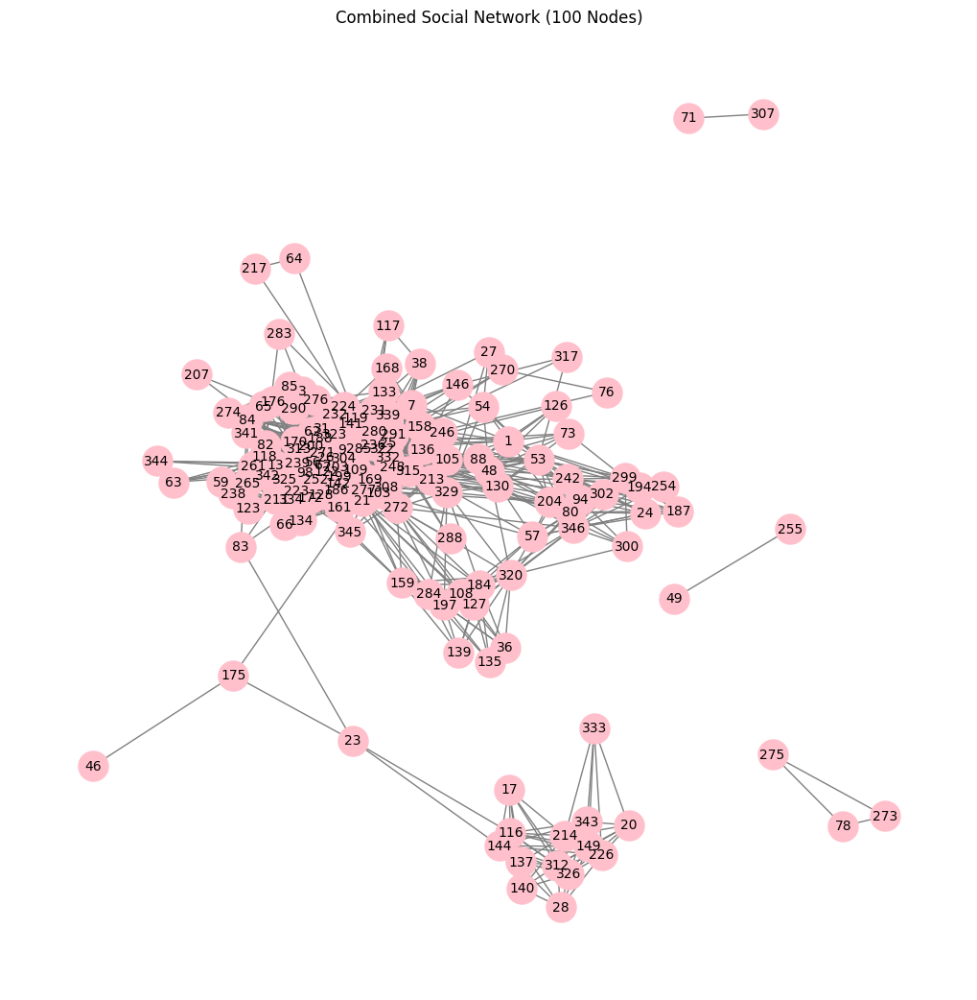

Combined Network Metrics:
Number of nodes: 3959
Number of edges: 84243
Average Clustering Coefficient: 0.5437
--------------------------------------------------


In [4]:
# Function to combine the networks of multiple nodes and plot the first 100 nodes
def plot_combined_network(node_ids, node_data):
    # Create an empty graph
    G_combined = nx.Graph() 
    
    # Add edges for each node's network to the combined graph
    for node_id in node_ids:
        edges_data = node_data[node_id]['edges']
        
        # Add edges for the current node
        for edge in edges_data:
            u, v = map(int, edge.split())
            G_combined.add_edge(u, v)
    
    # Get the first 100 nodes in the combined graph (if there are fewer, show them all)
    nodes_to_display = list(G_combined.nodes)[:150]
    subgraph = G_combined.subgraph(nodes_to_display)
    
    # Plot the combined network
    plt.figure(figsize=(10, 10))
    # Use spring layout for better node spacing
    pos = nx.spring_layout(subgraph, k=0.15, iterations=30)

    # Plot the subgraph with edges only
    nx.draw(subgraph, pos, with_labels=True, node_size=500, font_size=10, node_color="pink", edge_color="gray")
    plt.title("Combined Social Network (100 Nodes)")
    plt.show()
    
    # Print network metrics for the combined graph
    num_nodes = G_combined.number_of_nodes()
    num_edges = G_combined.number_of_edges()
    avg_clustering = nx.average_clustering(G_combined)
    
    print(f"Combined Network Metrics:")
    print(f"Number of nodes: {num_nodes}")
    print(f"Number of edges: {num_edges}")
    print(f"Average Clustering Coefficient: {avg_clustering:.4f}")
    print("-" * 50)

# Plot the combined network for the specified node_ids and their data
plot_combined_network(node_ids, node_data)


This code defines a function that combines the networks of multiple nodes by adding their edges to a single graph. It then visualizes the first 100 nodes (or fewer, if the graph has less than 100 nodes) of the combined network and prints key network metrics, such as the number of nodes, edges, and the average clustering coefficient for the entire combined network.








# Read the Edge List and Construct the Adjacency Matrix

This function constructs an adjacency matrix for a given node by parsing its edges and identifying the unique node indices. It then creates a sparse adjacency matrix using these indices, marking the connections between nodes as 1 for an undirected graph.








In [5]:
def construct_adjacency_matrix(node_id, node_data):
    edges_data = node_data[node_id]['edges']
    edges = []
    node_indices = set()  # Set to keep track of unique node indices
    
    # Parse the edges and add them to the list
    for edge in edges_data:
        u, v = map(int, edge.split())
        edges.append((u, v))
        node_indices.update([u, v])  # Add both nodes to the set
    
    # The size of the adjacency matrix should be based on the number of unique nodes
    max_node = max(node_indices)  # Get the highest node index
    
    # Create a sparse adjacency matrix with appropriate size
    adj_matrix = sp.lil_matrix((max_node + 1, max_node + 1))  # max_node + 1 because indices are 0-based
    
    # Populate the adjacency matrix
    for u, v in edges:
        adj_matrix[u, v] = 1
        adj_matrix[v, u] = 1  # Undirected graph
    
    return adj_matrix


# Compute Similarities for Weighted Graph

This function constructs a weighted adjacency matrix based on cosine similarity. It first retrieves and processes the feature data for a given node, computes the cosine similarity matrix between the features, and then converts the similarity matrix into a sparse adjacency matrix.








In [6]:
# Function to compute cosine similarity-based weighted adjacency matrix
def construct_weighted_adjacency_matrix(node_id, node_data):
    # Retrieve the features for the node
    feat_data = node_data[node_id]['feat']
    features = np.array([list(map(int, feat.split())) for feat in feat_data])
    
    # Compute the cosine similarity matrix
    similarity_matrix = cosine_similarity(features)
    
    # Convert the similarity to a sparse adjacency matrix
    adj_matrix = sp.lil_matrix(similarity_matrix)
    
    return adj_matrix


# k-Nearest Neighbors (k-NN) Graph Construction

This function builds a k-Nearest Neighbors (k-NN) graph for a given node by first retrieving its feature data. It then uses the NearestNeighbors model from scikit-learn to compute the k-nearest neighbors based on cosine distance and returns the resulting adjacency matrix representing the k-NN graph.








In [7]:
# Function to build a k-NN graph
def construct_knn_graph(node_id, node_data, k=5):
    # Retrieve the features for the node
    feat_data = node_data[node_id]['feat']
    features = np.array([list(map(int, feat.split())) for feat in feat_data])
    
    # Create a k-NN model
    knn = NearestNeighbors(n_neighbors=k, metric='cosine')
    knn.fit(features)
    
    # Get the k-nearest neighbors for each node
    adjacency_matrix = knn.kneighbors_graph(features, mode='connectivity')
    
    return adjacency_matrix


# Normalize the Graph


This function normalizes a graph's adjacency matrix using degree normalization. It computes the inverse square root of the node degrees and applies the normalization handling any potential division by zero in the process.

In [8]:
def normalize_graph(adj_matrix):
    # Degree normalization
    degree_matrix = np.array(adj_matrix.sum(axis=1)).flatten()
    degree_inv_sqrt = np.power(degree_matrix, -0.5)
    
    # Handle division by zero
    degree_inv_sqrt[np.isinf(degree_inv_sqrt)] = 0
    
    # Normalized adjacency matrix: D^(-1/2) * A * D^(-1/2)
    normalized_adj_matrix = adj_matrix.multiply(degree_inv_sqrt).T.multiply(degree_inv_sqrt).T
    
    return normalized_adj_matrix


This code iterates over a list of node IDs and constructs different types of adjacency matrices for each node: unweighted, weighted (based on cosine similarity), and k-NN (using 5 neighbors). It then normalizes the k-NN adjacency matrices using degree normalization and stores all these matrices in separate dictionaries for further use.

In [9]:
adj_matrices_unweighted = {}
adj_matrices_weighted = {}
adj_matrices_knn = {}
normalized_adj_matrices = {}

# For each node_id, construct adjacency matrices and normalize them
for node_id in node_ids:
    adj_matrices_unweighted[node_id] = construct_adjacency_matrix(node_id, node_data)
    adj_matrices_weighted[node_id] = construct_weighted_adjacency_matrix(node_id, node_data)
    adj_matrices_knn[node_id] = construct_knn_graph(node_id, node_data, k=5)  # k=5 neighbors
    normalized_adj_matrices[node_id] = normalize_graph(adj_matrices_knn[node_id])

# Shape of the adjacency matrices


This code loops through the node_ids and prints the shapes of the various adjacency matrices (unweighted, weighted, k-NN, and normalized k-NN) for each node. It provides a quick check on the dimensions of the adjacency matrices, helping to ensure that the matrices have been constructed correctly. Each matrix's shape is printed separately for each node, followed by a separator line for readability.








In [10]:
# Check the shape of the adjacency matrices for each node_id
for node_id in node_ids:
    print(f"--- Node {node_id} ---")

    # Unweighted adjacency matrix
    print(f"Unweighted Adjacency Matrix Shape    : {adj_matrices_unweighted[node_id].shape}")

    # Weighted adjacency matrix
    print(f"Weighted Adjacency Matrix Shape      : {adj_matrices_weighted[node_id].shape}")

    # k-NN adjacency matrix
    print(f"k-NN Adjacency Matrix Shape          : {adj_matrices_knn[node_id].shape}")

    # Normalized k-NN adjacency matrix
    print(f"Normalized k-NN Adjacency Matrix Shape: {normalized_adj_matrices[node_id].shape}")
    
    print("=" * 50)


--- Node 0 ---
Unweighted Adjacency Matrix Shape    : (348, 348)
Weighted Adjacency Matrix Shape      : (347, 347)
k-NN Adjacency Matrix Shape          : (347, 347)
Normalized k-NN Adjacency Matrix Shape: (347, 347)
--- Node 107 ---
Unweighted Adjacency Matrix Shape    : (1912, 1912)
Weighted Adjacency Matrix Shape      : (1045, 1045)
k-NN Adjacency Matrix Shape          : (1045, 1045)
Normalized k-NN Adjacency Matrix Shape: (1045, 1045)
--- Node 348 ---
Unweighted Adjacency Matrix Shape    : (573, 573)
Weighted Adjacency Matrix Shape      : (227, 227)
k-NN Adjacency Matrix Shape          : (227, 227)
Normalized k-NN Adjacency Matrix Shape: (227, 227)
--- Node 414 ---
Unweighted Adjacency Matrix Shape    : (686, 686)
Weighted Adjacency Matrix Shape      : (159, 159)
k-NN Adjacency Matrix Shape          : (159, 159)
Normalized k-NN Adjacency Matrix Shape: (159, 159)
--- Node 686 ---
Unweighted Adjacency Matrix Shape    : (857, 857)
Weighted Adjacency Matrix Shape      : (170, 170)
k-NN 

The output shows that the adjacency matrices for each node vary in size based on the network type. The unweighted adjacency matrices are larger, representing all possible connections, while the weighted, k-NN, and normalized k-NN matrices are smaller, reflecting filtered or localized connections based on feature similarities and k-nearest neighbors. These differences highlight varying levels of connectivity between nodes.

# Compute the Laplacian Matrix

The compute_laplacian function calculates the symmetric normalized Laplacian matrix for a given adjacency matrix. It first computes the degree matrix, then normalizes the adjacency matrix using the inverse square root of the degree matrix, which helps in capturing the structure of the graph more effectively for tasks like spectral clustering.

In [11]:
import warnings
warnings.filterwarnings("ignore")

def compute_laplacian(adj_matrix):
    """
    Compute the symmetric normalized Laplacian matrix for the given adjacency matrix.
    """
    # Compute degree matrix
    degrees = np.array(adj_matrix.sum(axis=1)).flatten()
    D = sp.diags(degrees)
    
    # Compute symmetric normalized Laplacian
    D_inv_sqrt = sp.diags(1.0 / np.sqrt(D.diagonal()))
    L_sym = sp.eye(adj_matrix.shape[0]) - D_inv_sqrt.dot(adj_matrix).dot(D_inv_sqrt)
    return L_sym

# Example: Compute Laplacian for each node_id's adjacency matrices
laplacians = {}

for node_id in node_ids:
    adj_matrix = adj_matrices_unweighted[node_id]  # Example with unweighted adjacency matrix
    laplacians[node_id] = compute_laplacian(adj_matrix)
    print(f"Node {node_id} - Laplacian shape: {laplacians[node_id].shape}")


Node 0 - Laplacian shape: (348, 348)
Node 107 - Laplacian shape: (1912, 1912)
Node 348 - Laplacian shape: (573, 573)
Node 414 - Laplacian shape: (686, 686)
Node 686 - Laplacian shape: (857, 857)
Node 698 - Laplacian shape: (896, 896)
Node 1684 - Laplacian shape: (3437, 3437)
Node 1912 - Laplacian shape: (2661, 2661)
Node 3437 - Laplacian shape: (3980, 3980)
Node 3980 - Laplacian shape: (4039, 4039)


The Laplacian matrices for each node correspond to the shape of the respective adjacency matrix, with dimensions indicating the number of nodes in the graph. The matrices are square, with sizes ranging from 348x348 to 4039x4039, reflecting the varying network sizes for each node.








# Eigenvalue Decomposition (Laplacian Eigenvectors)

The code computes the eigenvalues and eigenvectors of the Laplacian matrix for each node in the graph, sorting them in increasing order. It extracts and stores the first 50 eigenvalues and corresponding eigenvectors for each node and prints the first 10 eigenvalues and the shape of the eigenvectors. This analysis helps understand the spectral properties of the graph structure associated with each node.

In [12]:
def analyze_laplacian(L):
    """
    Compute all eigenvalues and eigenvectors of the Laplacian matrix and sort them
    in increasing order based on eigenvalues.
    """
    eigenvalues, eigenvectors = eigh(L)
    sorted_indices = np.argsort(eigenvalues)  # Sort eigenvalues in increasing order
    sorted_eigenvalues = eigenvalues[sorted_indices]
    sorted_eigenvectors = eigenvectors[:, sorted_indices]
    return sorted_eigenvalues[:50], sorted_eigenvectors[:, :50]


# Dictionary to store eigenvalues and eigenvectors for each node_id
eigenvalues = {}
eigenvectors = {}

# Loop through node_ids and compute eigenvalues/eigenvectors
for node_id in node_ids:
    # Assuming laplacians is a dictionary of {node_id: laplacian_matrix}
    L_sym = laplacians[node_id]  # Laplacian for current node_id
    
    # Convert sparse matrix to dense if necessary
    if sp.issparse(L_sym):
        L_sym = L_sym.toarray()
    
    # Compute eigenvalues and eigenvectors
    eigvals, eigvecs = analyze_laplacian(L_sym)
    
    # Store eigenvalues and eigenvectors
    eigenvalues[node_id] = eigvals
    eigenvectors[node_id] = eigvecs
    
    # Print information in a cleaner format
    print(f"--- Node {node_id} Analysis ---")
    print(f"Top 10 Eigenvalues    : {eigvals[:10]}")
    print(f"Eigenvectors Shape    : {eigvecs.shape}")
    print("=" * 50)

--- Node 0 Analysis ---
Top 10 Eigenvalues    : [-2.25741825e-16 -1.98470112e-16 -1.31063002e-16 -1.02569436e-16
  6.45646576e-17  5.78827887e-03  9.43725743e-03  2.63226963e-02
  3.80019007e-02  4.33428798e-02]
Eigenvectors Shape    : (348, 50)
--- Node 107 Analysis ---
Top 10 Eigenvalues    : [1.36841532e-17 1.90810102e-02 2.76639274e-02 4.84286700e-02
 7.71427637e-02 8.31207852e-02 1.11019834e-01 1.20429365e-01
 1.22932825e-01 1.59010694e-01]
Eigenvectors Shape    : (1912, 50)
--- Node 348 Analysis ---
Top 10 Eigenvalues    : [-2.77343603e-16  1.21326295e-02  9.24704505e-02  1.40521039e-01
  2.39502180e-01  2.79012524e-01  2.84970397e-01  2.90483294e-01
  3.37728437e-01  3.52815148e-01]
Eigenvectors Shape    : (573, 50)
--- Node 414 Analysis ---
Top 10 Eigenvalues    : [1.35787456e-16 2.74206467e-16 4.10663628e-03 5.62070627e-02
 3.98081996e-01 4.38181823e-01 5.41893139e-01 5.75672245e-01
 6.01603567e-01 6.43788735e-01]
Eigenvectors Shape    : (686, 50)
--- Node 686 Analysis ---
Top

The output displays the eigenvalues and eigenvector shapes for multiple nodes. For each node, the eigenvalues represent the magnitude of variation along principal components, while the eigenvectors' shapes indicate the number of components and dimensions involved in the analysis. Each node corresponds to a different dataset, with varying sizes of eigenvectors (e.g., (348, 50) for Node 0, (1912, 50) for Node 107), suggesting different levels of complexity in their respective data.








## Find optimal number of clusters

This code extracts the first 50 eigenvalues for each node, computes the gaps between consecutive eigenvalues, and identifies the largest gap to determine the optimal value of k. It then visualizes the eigenvalues and the location of the largest gap for each node and stores the optimal k values in a dictionary, which is saved to a file (optimal_k_values.npy). The process includes error handling for missing data or other issues.








Node 0 - Largest Eigen Gap: 0.084134956746519
Node 0 - Optimal k: 20


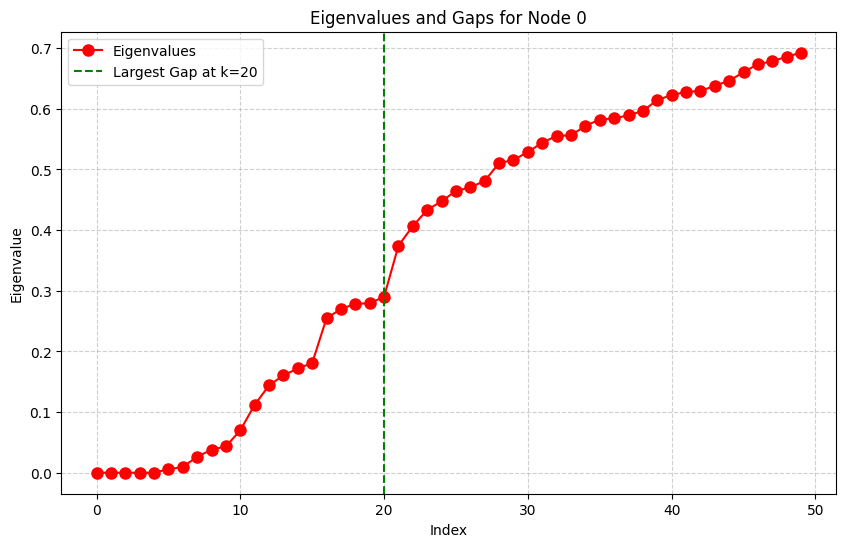

Node 107 - Largest Eigen Gap: 0.03940804217612082
Node 107 - Optimal k: 9


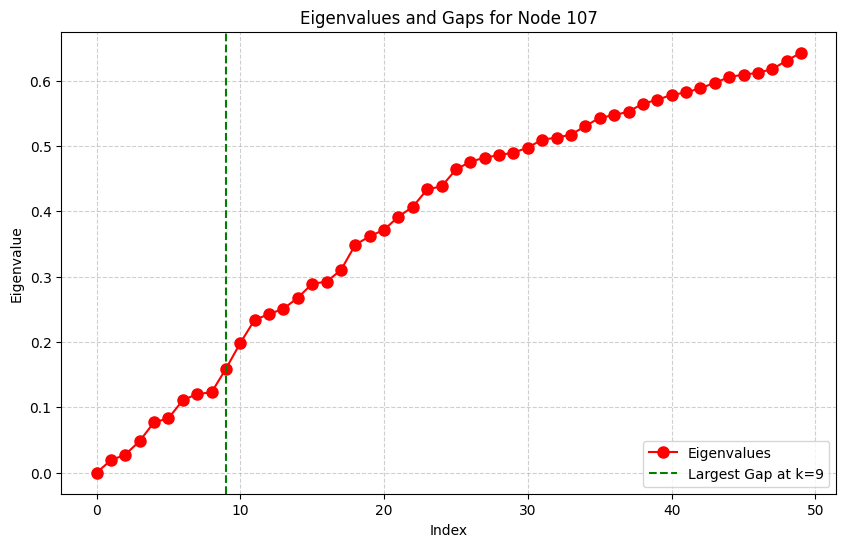

Node 348 - Largest Eigen Gap: 0.12292962865800205
Node 348 - Optimal k: 9


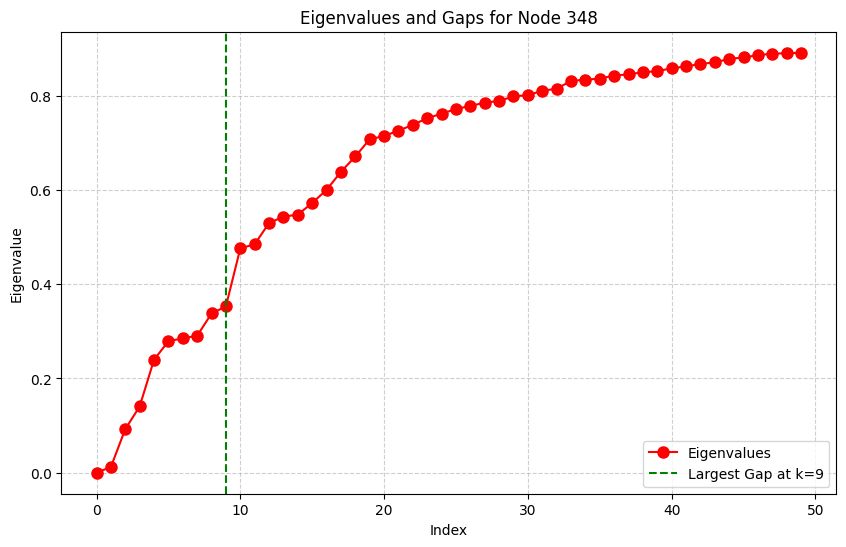

Node 414 - Largest Eigen Gap: 0.3418749331245471
Node 414 - Optimal k: 3


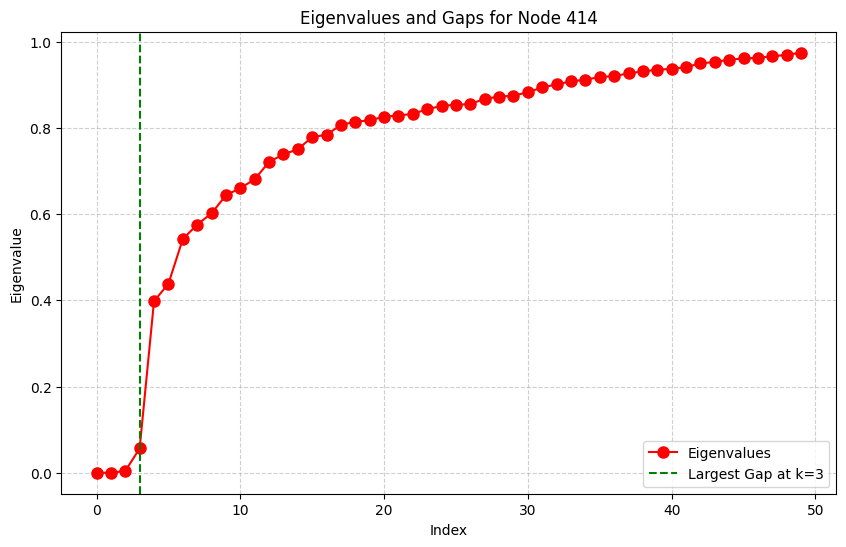

Node 686 - Largest Eigen Gap: 0.15349223840373213
Node 686 - Optimal k: 3


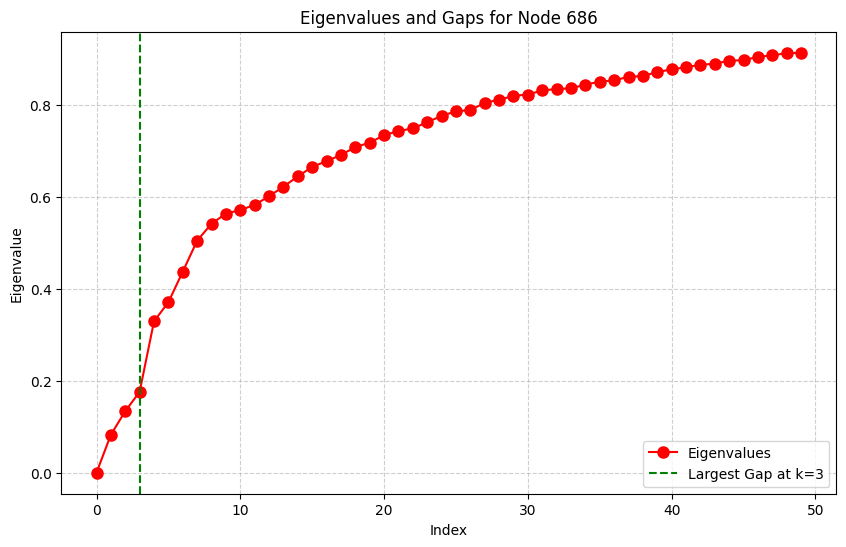

Node 698 - Largest Eigen Gap: 0.21546398022701507
Node 698 - Optimal k: 5


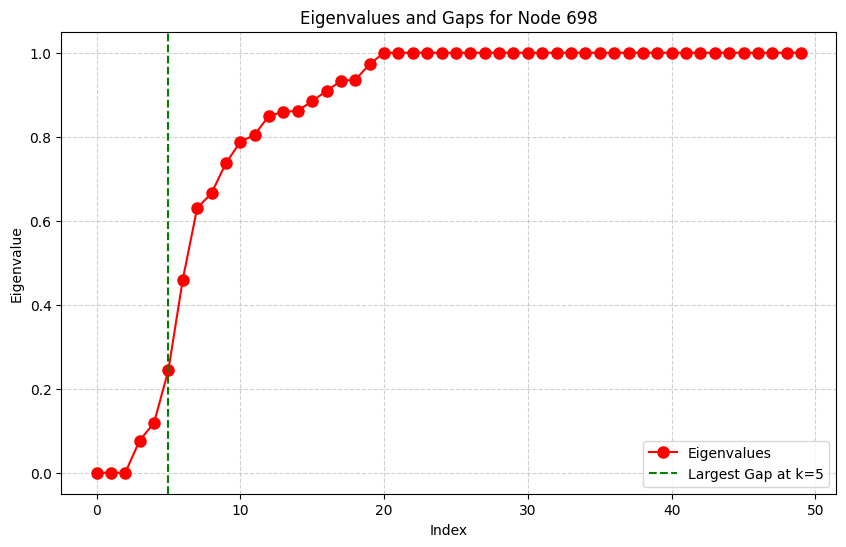

Node 1684 - Largest Eigen Gap: 0.08008294576493297
Node 1684 - Optimal k: 9


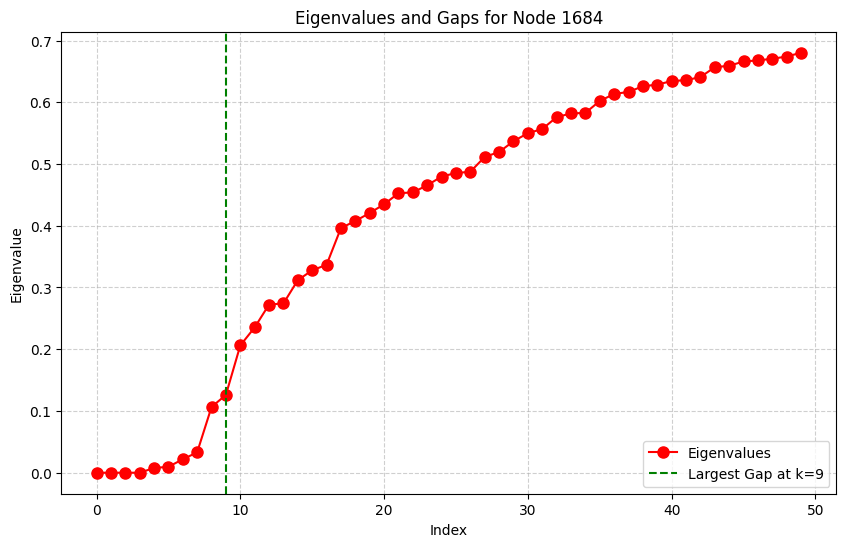

Node 1912 - Largest Eigen Gap: 0.14399036086978384
Node 1912 - Optimal k: 9


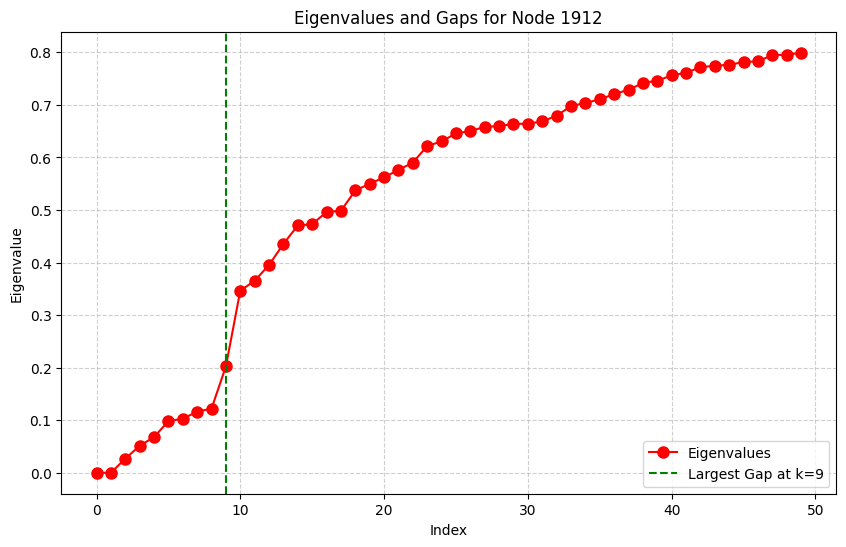

Node 3437 - Largest Eigen Gap: 0.058567532328367866
Node 3437 - Optimal k: 23


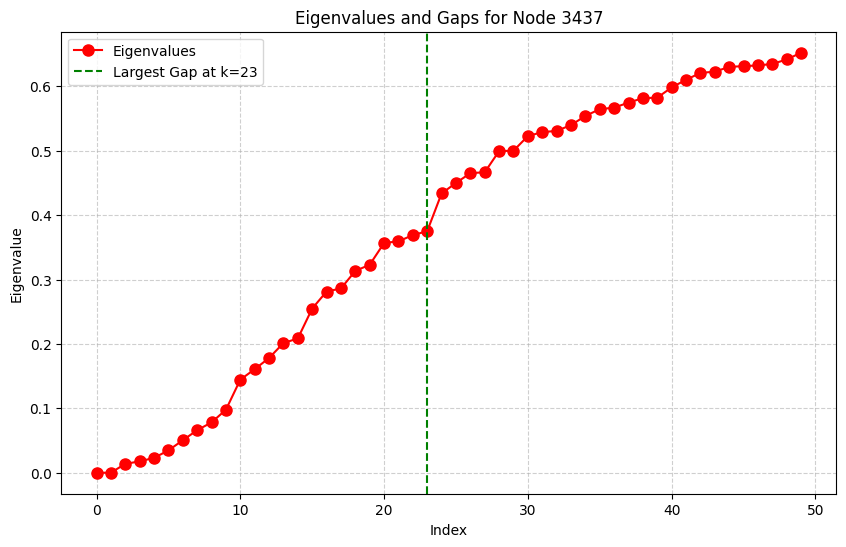

Node 3980 - Largest Eigen Gap: 0.20662174139332623
Node 3980 - Optimal k: 9


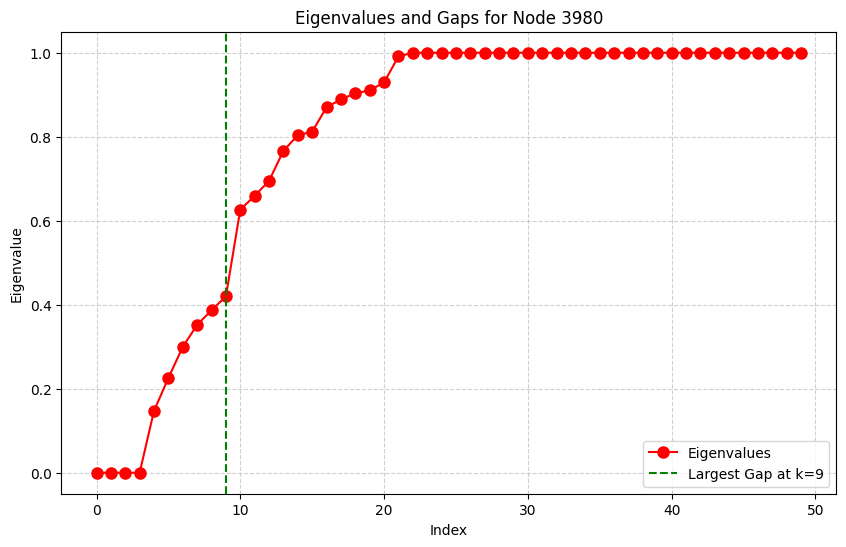

Optimal k values have been saved to 'optimal_k_values.npy'.


In [13]:
# Dictionary to store the optimal k values for each node
optimal_k_values = {}

for node_id in node_ids:
    try:
        # Step 1: Extract eigenvalues
        node_eigenvalues = eigenvalues[node_id]
        
        # Step 2: Use only the first 50 eigenvalues
        node_eigenvalues = node_eigenvalues[:50]
        node_eigenvalues = np.maximum(node_eigenvalues, 0)  # Ensure non-negative eigenvalues
        
        # Step 3: Compute gaps and find the largest gap
        eigen_gaps = np.diff(node_eigenvalues)
        largest_gap = np.max(eigen_gaps)
        gap_index = np.argmax(eigen_gaps)
        
        # Step 4: Determine k based on the largest gap's index
        optimal_k = gap_index 
        optimal_k_values[node_id] = optimal_k
        
        print(f"Node {node_id} - Largest Eigen Gap: {largest_gap}")
        print(f"Node {node_id} - Optimal k: {optimal_k}")
        
        # Step 5: Visualize eigenvalues and the largest gap
        plt.figure(figsize=(10, 6))
        plt.plot(node_eigenvalues, 'o-', label="Eigenvalues", markersize=8, color='red')  # Changed to red
        plt.axvline(x=gap_index, color='green', linestyle='--', label=f"Largest Gap at k={optimal_k}")
        plt.title(f"Eigenvalues and Gaps for Node {node_id}")
        plt.xlabel("Index")
        plt.ylabel("Eigenvalue")
        plt.legend()
        plt.grid(True, linestyle="--", alpha=0.6)
        plt.show()
        
    except KeyError as e:
        print(f"KeyError: {e} - No data found for node {node_id}")
    except Exception as e:
        print(f"Error processing node {node_id}: {e}")

# Save optimal k values for each node
np.save("optimal_k_values.npy", optimal_k_values)
print("Optimal k values have been saved to 'optimal_k_values.npy'.")

This code extracts the eigenvectors for each node, retrieves the optimal k value for that node, and then decomposes the eigenvector matrix by selecting the top k eigenvectors (excluding the first eigenvector). The decomposed eigenvectors are stored in a dictionary, with each node's corresponding eigenvector matrix. The shape of the decomposed eigenvector matrix for each node is printed, and error handling is included for missing data or other issues.

In [14]:
# Dictionary to store the decomposed eigenvector matrices
decomposed_eigenvectors = {}

for node_id in node_ids:
    try:
        # Step 1: Extract the eigenvectors for the node
        eigvecs = eigenvectors[node_id]
        
        # Step 2: Retrieve the optimal k value for the current node
        optimal_k = optimal_k_values[node_id]
        
        # Step 3: Decompose the eigenvector matrix using the first k eigenvectors
        # Skip the first eigenvector corresponding to the smallest eigenvalue
        top_k_eigenvectors = eigvecs[:, 1:optimal_k + 1]  # Exclude the 0th eigenvector
        
        # Store the decomposed eigenvector matrix in the dictionary
        decomposed_eigenvectors[node_id] = top_k_eigenvectors
        
        print(f"Node {node_id} - Decomposed Eigenvectors Shape: {top_k_eigenvectors.shape}")
    
    except KeyError as e:
        print(f"KeyError: {e} - Missing data for node {node_id}")
    except Exception as e:
        print(f"Error processing node {node_id}: {e}")


Node 0 - Decomposed Eigenvectors Shape: (348, 20)
Node 107 - Decomposed Eigenvectors Shape: (1912, 9)
Node 348 - Decomposed Eigenvectors Shape: (573, 9)
Node 414 - Decomposed Eigenvectors Shape: (686, 3)
Node 686 - Decomposed Eigenvectors Shape: (857, 3)
Node 698 - Decomposed Eigenvectors Shape: (896, 5)
Node 1684 - Decomposed Eigenvectors Shape: (3437, 9)
Node 1912 - Decomposed Eigenvectors Shape: (2661, 9)
Node 3437 - Decomposed Eigenvectors Shape: (3980, 23)
Node 3980 - Decomposed Eigenvectors Shape: (4039, 9)


# KMeans Clustering

This code performs k-means clustering on the top k eigenvectors for each node, where k is determined by the previously computed optimal k value. It retrieves the decomposed eigenvectors and applies the k-means algorithm to group the eigenvectors into clusters. The resulting cluster labels for each node are stored in a dictionary. If any issues arise, such as missing eigenvectors or optimal k values, appropriate error messages are displayed.








In [15]:
def perform_kmeans_clustering(eigenvectors, k):
    """
    Perform k-means clustering on the eigenvectors with a specified number of clusters k.
    """
    kmeans = KMeans(n_clusters=k, random_state=42)  # Set random_state for reproducibility
    cluster_labels = kmeans.fit_predict(eigenvectors)
    return cluster_labels

# Dictionary to store cluster labels for each node
cluster_labels = {}

for node_id in node_ids:
    try:
        # Step 1: Retrieve the decomposed eigenvector matrix for the current node
        top_k_eigenvectors = decomposed_eigenvectors[node_id]
        
        # Step 2: Retrieve the optimal k value for the current node
        optimal_k = optimal_k_values[node_id]
        
        # Step 3: Perform k-means clustering on the top k eigenvectors
        cluster_labels[node_id] = perform_kmeans_clustering(top_k_eigenvectors, k=optimal_k)
        
        # Print results in a cleaner format
        print(f"--- Node {node_id} Clustering Results ---")
        print(f"Optimal k Value               : {optimal_k}")
        print(f"Cluster Labels (First 10)     : {cluster_labels[node_id][:10]}")
        print(f"Total Clusters                : {len(set(cluster_labels[node_id]))}")
        print("=" * 50)
    
    except KeyError as e:
        print(f"KeyError: {e} - Missing decomposed eigenvectors or optimal k for node {node_id}")
    except Exception as e:
        print(f"Error processing node {node_id}: {e}")

--- Node 0 Clustering Results ---
Optimal k Value               : 20
Cluster Labels (First 10)     : [12 12  6 12  5 12 13 12 16 12]
Total Clusters                : 20
--- Node 107 Clustering Results ---
Optimal k Value               : 9
Cluster Labels (First 10)     : [0 0 0 0 0 0 0 0 0 0]
Total Clusters                : 9
--- Node 348 Clustering Results ---
Optimal k Value               : 9
Cluster Labels (First 10)     : [0 0 0 0 0 0 0 0 0 0]
Total Clusters                : 9
--- Node 414 Clustering Results ---
Optimal k Value               : 3
Cluster Labels (First 10)     : [0 0 0 0 0 0 0 0 0 0]
Total Clusters                : 3
--- Node 686 Clustering Results ---
Optimal k Value               : 3
Cluster Labels (First 10)     : [0 0 0 0 0 0 0 0 0 0]
Total Clusters                : 3
--- Node 698 Clustering Results ---
Optimal k Value               : 5
Cluster Labels (First 10)     : [0 0 0 0 0 0 0 0 0 0]
Total Clusters                : 5
--- Node 1684 Clustering Results ---
Optim

# Visualizing the Clusters

This function visualizes the clusters of nodes in a graph, based on the clustering results from k-means. It constructs a NetworkX graph from the adjacency matrix and adds a central node, which is the node_id passed to the function. Then, it computes a spring layout for the graph to determine the positions of the nodes, ensuring that the central node is positioned at the center of the plot. The nodes are colored according to their cluster labels, and the graph is plotted with labeled nodes and edges. The plot gives a visual representation of how the nodes are grouped into clusters, with the central node connected to all other nodes.








In [16]:
def visualize_clusters(node_id, adj_matrix, cluster_labels, k):
    # Convert sparse adjacency matrix to dense format if needed
    adj_matrix_dense = adj_matrix.todense() if isinstance(adj_matrix, sp.csr_matrix) else np.array(adj_matrix)

    # Create a NetworkX graph from the adjacency matrix
    G = nx.from_numpy_array(adj_matrix_dense)

    # Add a central node (the main node) and connect it to all other nodes
    central_node = node_id
    G.add_node(central_node)
    
    # Connect the central node to all other nodes in the graph (if not already connected)
    for node in G.nodes():
        if node != central_node:
            G.add_edge(central_node, node)
    
    # Get positions of nodes using spring layout
    pos = nx.spring_layout(G, seed=42, k=0.15)  # k adjusts the distance between nodes

    # Ensure the central node is at the center (manual adjustment of positions)
    pos[central_node] = np.array([0, 0])  # Place central node at the center of the plot

    # Create a color map based on cluster labels
    # Assuming cluster_labels is a list/array where index corresponds to node id
    colors = [cluster_labels[node] for node in G.nodes()]

    # Define a color map with lighter shades (by using lighter versions of the 'tab20' colormap)
    cmap = plt.cm.get_cmap('tab20', k)  # 'tab20' has 20 distinct colors
    colors = [cmap(i / k) for i in colors]  # Normalize the cluster indices to the colormap range

    # Plot the graph
    plt.figure(figsize=(10, 10))

    # Draw nodes with colors based on clusters (adjust alpha for lightness)
    nx.draw_networkx_nodes(G, pos, node_size=300, node_color=colors, alpha=0.6)  # Lighter nodes with alpha=0.6

    # Draw edges with transparency
    nx.draw_networkx_edges(G, pos, alpha=0.3)  # Lighter edges with alpha=0.3

    # Draw labels with font size
    nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

    # Title of the plot
    plt.title(f"Community Structure (Node {node_id} Clusters)")

    # Display the plot
    plt.show()

This code limits the number of nodes processed to max_nodes (500 in this case). It iterates over each node, retrieves the corresponding adjacency matrix, and converts it into a dense format if it's a sparse matrix. Before passing the adjacency matrix to the visualize_clusters function, it performs validation checks to ensure the matrix is 2D and not empty. The function visualize_clusters is then called with the node's adjacency matrix, cluster labels, and optimal k value. The node count is incremented after processing each node, and the loop will break once it processes 500 nodes. This ensures that the process doesn't exceed the specified node limit.








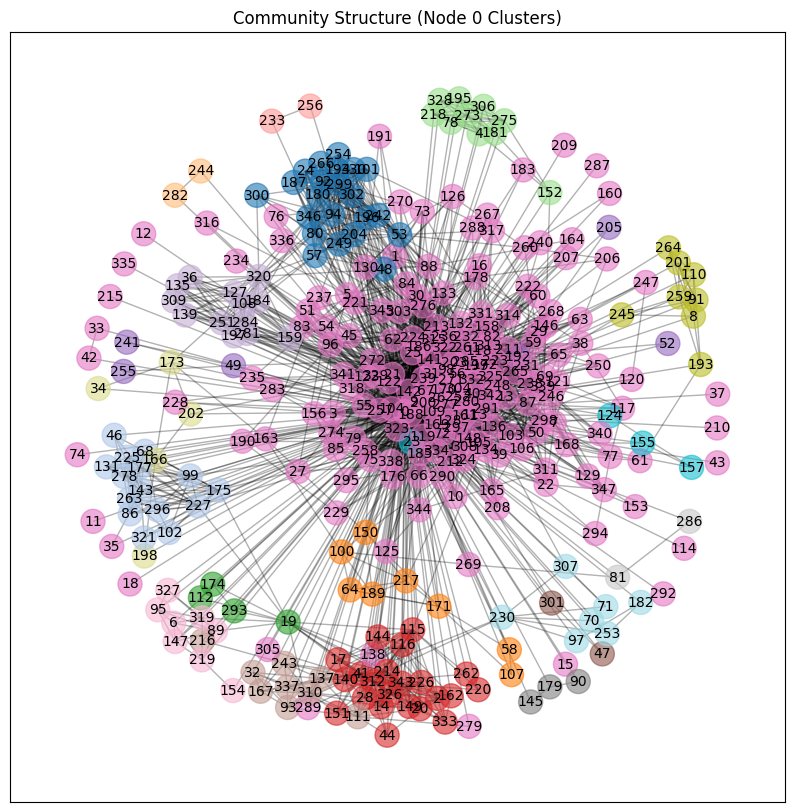

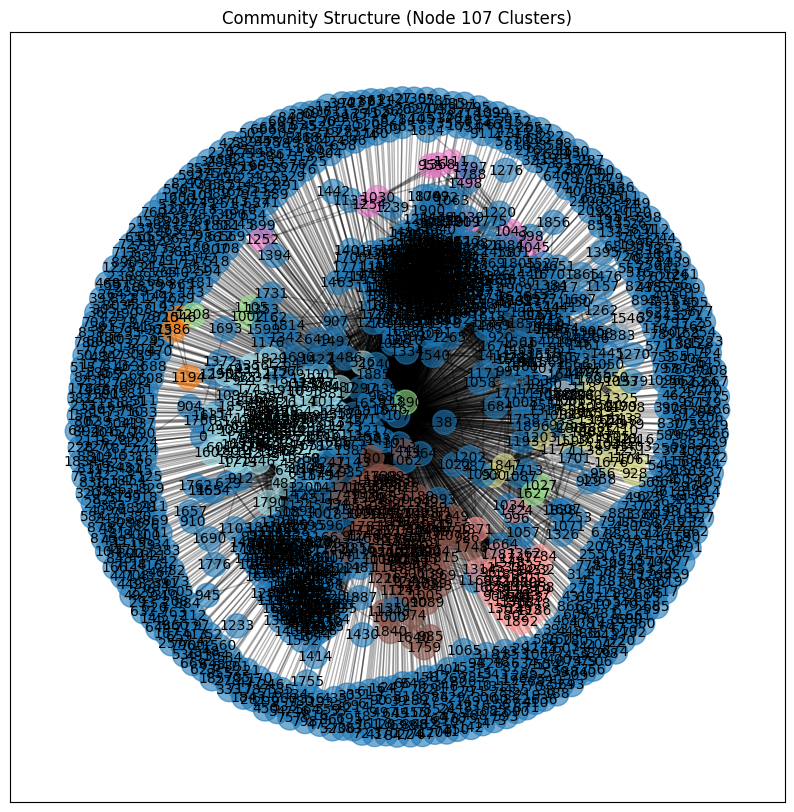

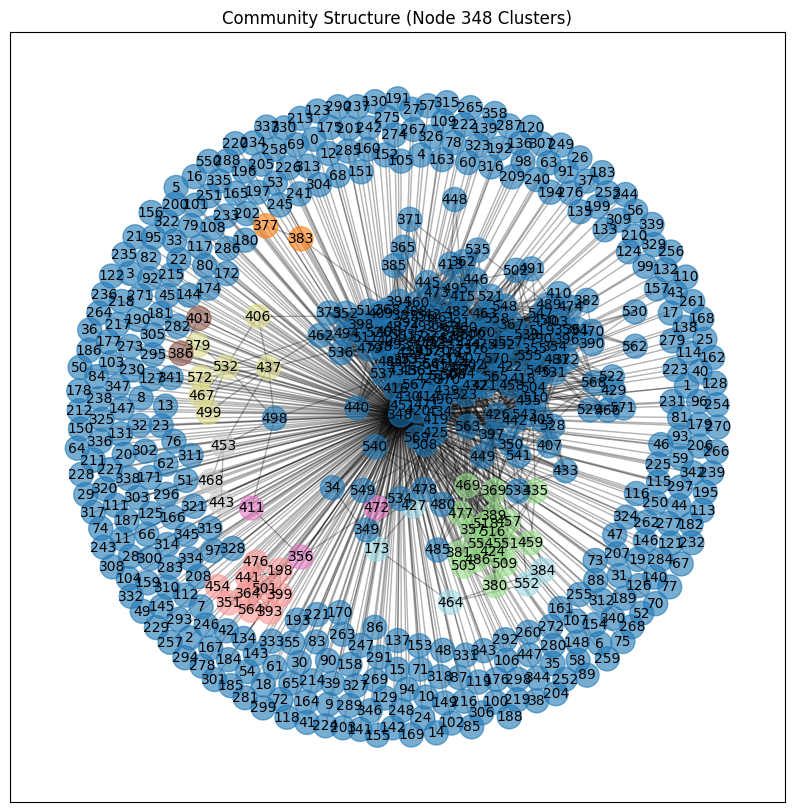

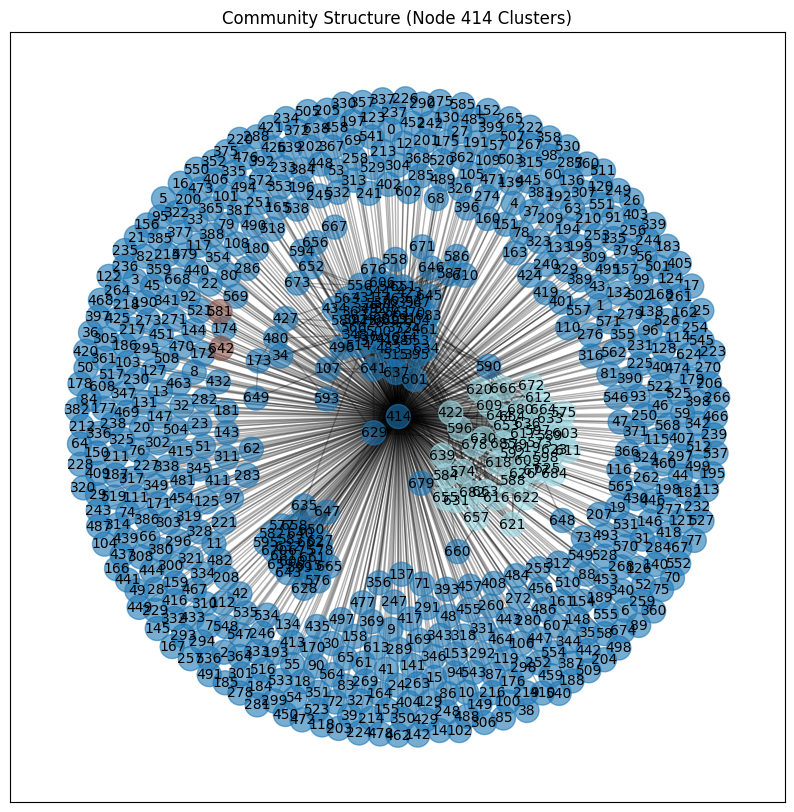

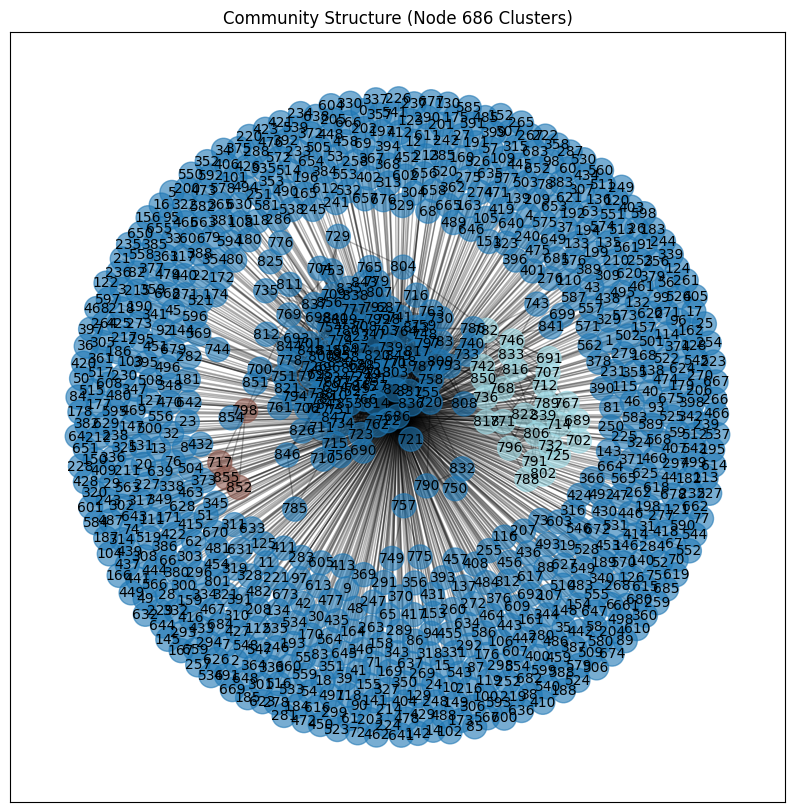

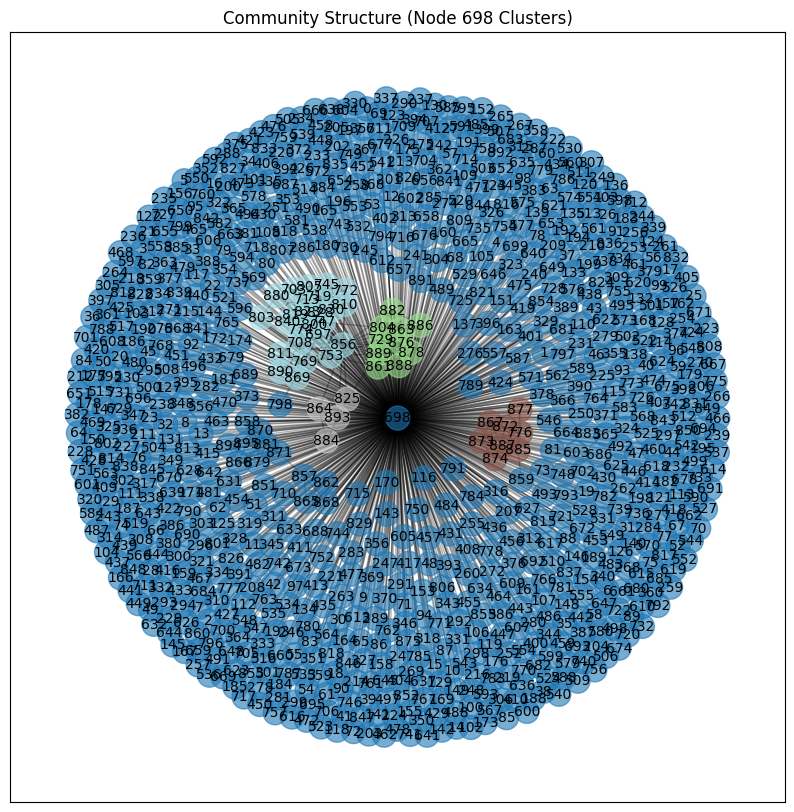

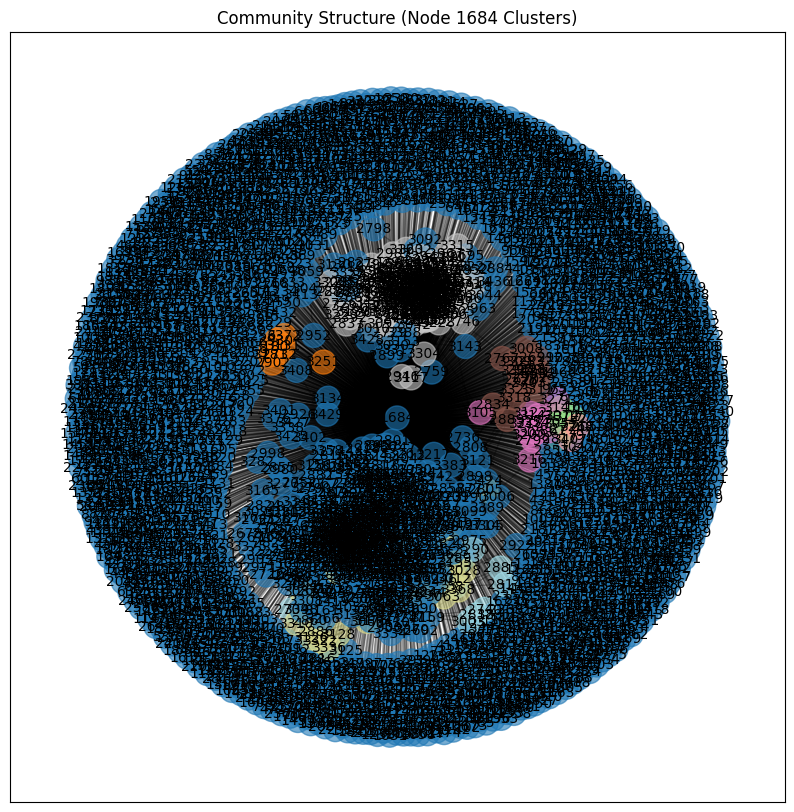

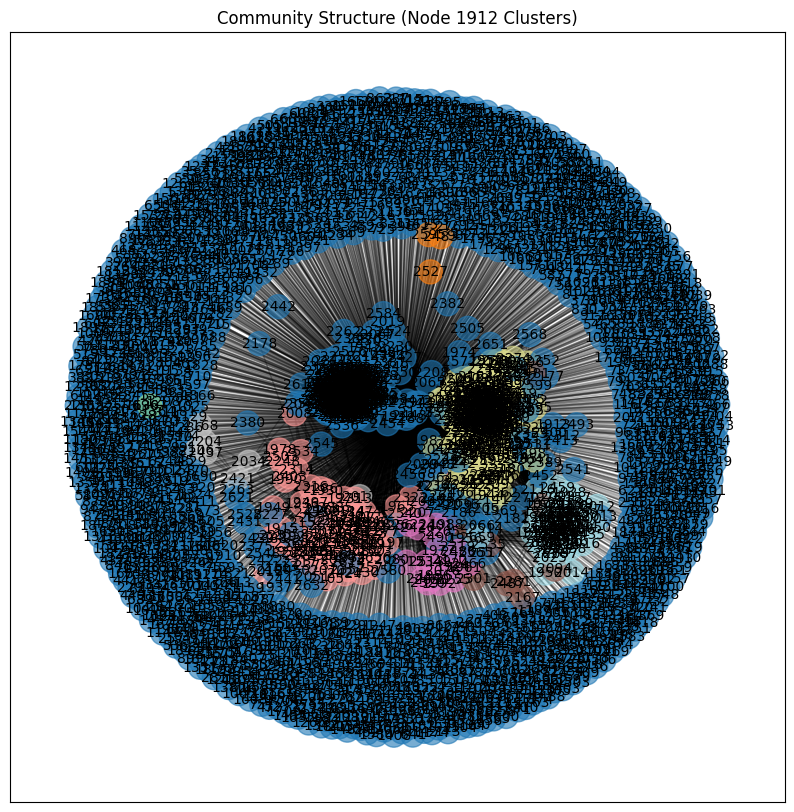

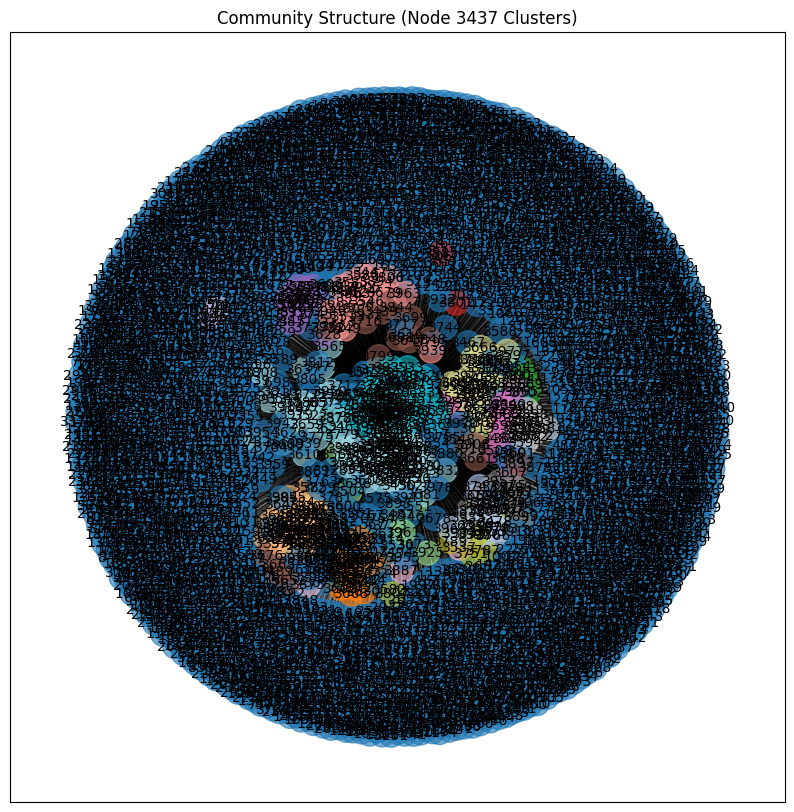

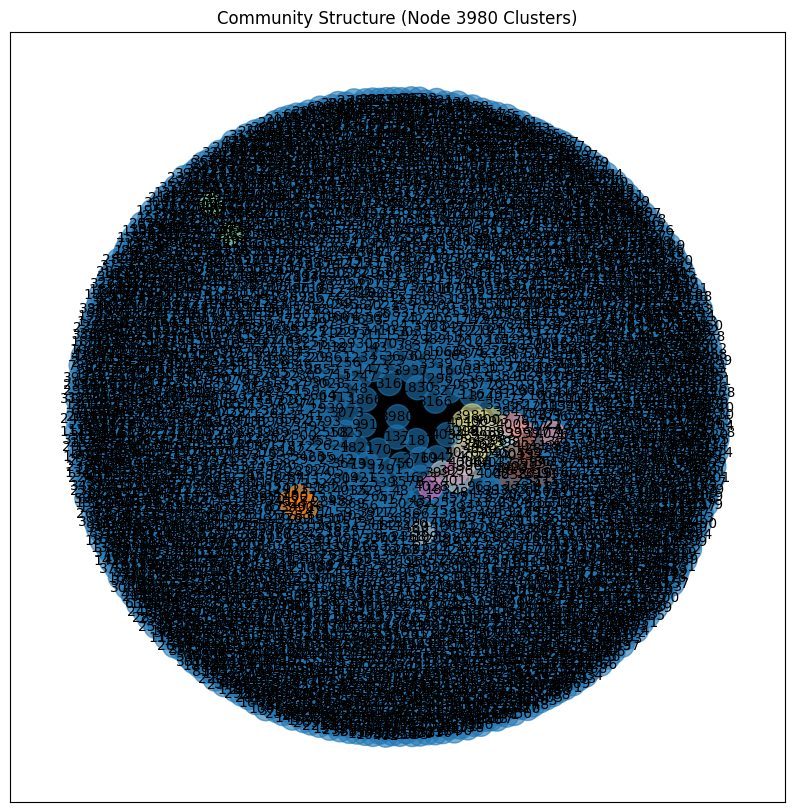

In [19]:
# Limit the number of nodes to process
max_nodes = 150
node_count = 0

for node_id in node_ids:
    # Break the loop after processing 500 nodes
    if node_count >= max_nodes:
        break

    adj_matrix = adj_matrices_unweighted[node_id]  
    
    # Check if the adjacency matrix is a sparse matrix
    if sp.issparse(adj_matrix):
        # Convert sparse matrix to CSR format
        adj_matrix = adj_matrix.tocsr()
    
    # Convert to dense format for visualization (if needed)
    adj_matrix_dense = adj_matrix.toarray() if sp.issparse(adj_matrix) else np.array(adj_matrix)

    # Validation checks
    if adj_matrix_dense.ndim != 2:
        print(f"Error: Adjacency matrix for Node {node_id} is not 2D!")
        continue
    
    if adj_matrix_dense.size == 0 or not np.any(adj_matrix_dense):
        print(f"Error: Adjacency matrix for Node {node_id} is empty or has no edges.")
        continue
    
    # Get the optimal k value for this node
    optimal_k = optimal_k_values[node_id]  # Retrieve optimal k for this node
    
    # Pass the processed adjacency matrix and the optimal k to the visualization function
    cluster_labels_for_node = cluster_labels[node_id]
    visualize_clusters(node_id, adj_matrix_dense, cluster_labels_for_node, k=optimal_k)  # Use optimal k

    # Increment the node count
    node_count += 1

# Evaluate Clustering Performance (Silhouette Score)

The code evaluates clustering quality for each node using metrics like Silhouette Score, Modularity, and intra/inter-cluster distances. It then displays the results in a styled pandas DataFrame, highlighting the best and worst values for each metric.








In [18]:
# Function to compute modularity (adjusted)
def compute_modularity(graph, cluster_labels):
    """
    Compute modularity for a given graph and clustering.
    """
    communities = {label: [] for label in set(cluster_labels)}
    for idx, label in enumerate(cluster_labels):
        communities[label].append(idx)
    
    return nx.algorithms.community.quality.modularity(graph, list(communities.values()))

# Function to compute intra-cluster and inter-cluster distances
def intra_inter_cluster_distances(data, labels):
    """
    Compute intra-cluster and inter-cluster distances.
    """
    unique_clusters = np.unique(labels)
    intra_distances = []
    inter_distances = []

    for cluster in unique_clusters:
        cluster_points = data[labels == cluster]
        
        # Compute intra-cluster distance (compactness)
        if len(cluster_points) > 1:
            intra_distances.append(np.mean(cdist(cluster_points, cluster_points)))

        # Compute inter-cluster distance (separation)
        for other_cluster in unique_clusters:
            if other_cluster != cluster:
                other_points = data[labels == other_cluster]
                inter_distances.append(np.mean(cdist(cluster_points, other_points)))

    mean_intra = np.mean(intra_distances) if intra_distances else 0
    min_inter = np.min(inter_distances) if inter_distances else 0

    return mean_intra, min_inter

# Function to evaluate clustering
def evaluate_clustering(node_id, adj_matrix, eigenvectors, cluster_labels, ground_truth=None):
    """
    Evaluate clustering using multiple metrics and return results as a dictionary.
    """
    result = {"Node ID": node_id}

    # Silhouette Score
    try:
        silhouette_avg = silhouette_score(eigenvectors, cluster_labels)
        result["Silhouette Score"] = silhouette_avg
    except Exception as e:
        result["Silhouette Score"] = None
        print(f"Silhouette Score Error: {e}")

    # Modularity
    try:
        graph = nx.from_numpy_array(adj_matrix)  # Create graph from adjacency matrix
        modularity_score = compute_modularity(graph, cluster_labels)
        result["Modularity"] = modularity_score
    except Exception as e:
        result["Modularity"] = None
        print(f"Modularity Error: {e}")

    # Intra-Cluster and Inter-Cluster Distances
    try:
        intra_distance, inter_distance = intra_inter_cluster_distances(eigenvectors, cluster_labels)
        result["Intra-Cluster Dist"] = intra_distance
        result["Inter-Cluster Dist"] = inter_distance
    except Exception as e:
        result["Intra-Cluster Dist"] = None
        result["Inter-Cluster Dist"] = None
        print(f"Intra/Inter-Cluster Distance Error: {e}")

    return result

# Example: Evaluate clustering for each node_id
results = []

for node_id in node_ids:
    try:
        # Retrieve the adjacency matrix and top k eigenvectors
        adj_matrix = adj_matrices_unweighted[node_id]  # Use the unweighted adjacency matrix
        top_k_eigenvectors = decomposed_eigenvectors[node_id]
        cluster_labels_for_node = cluster_labels[node_id]

        # Extract ground truth labels for this node if available
        ground_truth = node_data.get(node_id, {}).get('circles')  # Handle missing ground truth gracefully

        # Evaluate clustering and store the result
        result = evaluate_clustering(node_id, adj_matrix, top_k_eigenvectors, cluster_labels_for_node, ground_truth)
        results.append(result)
    except Exception as e:
        print(f"Error evaluating clustering for Node {node_id}: {e}")

# Convert results into a pandas DataFrame for nice tabular output
df = pd.DataFrame(results)

# Apply better formatting and styling to the DataFrame
def style_table(df):
    # Apply a heatmap for the numerical values (conditional formatting)
    styled = df.style.background_gradient(axis=None, cmap='viridis')
    
    # Format the numerical values to two decimal places
    styled = styled.format("{:.2f}", subset=["Silhouette Score", "Modularity", "Intra-Cluster Dist", "Inter-Cluster Dist"])
    
    # Highlight the best and worst values for specific metrics
    styled = styled.applymap(lambda x: 'color: yellow' if x == df["Silhouette Score"].max() else '', subset=["Silhouette Score"])
    styled = styled.applymap(lambda x: 'color: red' if x == df["Modularity"].min() else '', subset=["Modularity"])
    
    return styled

# Display the result table with applied style
styled_df = style_table(df)

# Show the styled DataFrame (this will work in Jupyter notebooks and similar environments)
styled_df


,Node ID,Silhouette Score,Modularity,Intra-Cluster Dist,Inter-Cluster Dist
0,0,0.68,0.38,0.07,0.22
1,107,0.67,0.28,0.04,0.09
2,348,0.81,0.10,0.08,0.23
3,414,0.80,0.36,0.02,0.13
4,686,0.93,0.13,0.03,0.18
5,698,0.96,0.51,0.05,0.20
6,1684,0.82,0.49,0.04,0.07
7,1912,0.78,0.50,0.05,0.06
8,3437,0.91,0.60,0.06,0.11
9,3980,0.99,0.43,0.09,0.32



The table shows clustering evaluation results for different nodes, with metrics including Silhouette Score, Modularity, Intra-Cluster Distance, and Inter-Cluster Distance. The values indicate how well the clusters are formed, with higher Silhouette Scores and Modularity suggesting better clustering quality, while lower Intra-Cluster Distances and higher Inter-Cluster Distances indicate more compact and separated clusters.








# Results

## Summary of findings

Node 3980 has the highest silhouette score (0.99), indicating near-perfect cluster quality, with significant inter-cluster distance (0.32).

Node 686 and Node 698 also show high silhouette scores (0.96), but Node 686 has low modularity (0.01), suggesting weak community detection.

Node 3437 combines a high silhouette score (0.90) with strong modularity (0.59), indicating robust and distinct clustering.
Node 348 and Node 414 demonstrate good clustering (silhouette scores >0.80), though modularity varies.

Lower modularity nodes (e.g., Node 686, Node 1684) suggest weaker community structure despite high silhouette scores, while high modularity nodes like 698 and 3437 exhibit well-separated and cohesive clusters.

## Model

Spectral clustering (graph-based clustering method)

## Details of the clustering process

Step 1: Construct a similarity graph from the Facebook Social Circles Dataset, where nodes represent individuals and edges represent interactions or friendships.

Step 2: Create an adjacency matrix to measure the similarity between nodes.

Step 3: Compute the graph's Laplacian matrix and perform eigenvalue decomposition.

Step 4: Use the eigenvectors corresponding to the smallest eigenvalues to represent the data in a reduced-dimensional space.

Step 5: Apply a traditional clustering algorithm (e.g., k-means) on the eigenvectors to identify distinct social circles within the network.

Step 6: Analyze the resulting clusters to uncover community structures in the social network.







## Conclusion

We used spectral clustering on the Facebook Social Circles Dataset to identify distinct communities based on interactions. By constructing a similarity graph and applying dimensionality reduction with the Laplacian matrix, we successfully segmented the data. This approach highlights spectral clustering's effectiveness in analyzing social structures, with potential applications in marketing, sociology, and network analysis. Future work could explore advanced graph algorithms for improved clustering accuracy.

## key points

Spectral Clustering Model: A graph-based clustering method used for community detection.

Similarity Graph Construction: Nodes represent individuals, and edges represent friendships or interactions.
Adjacency Matrix Creation: Measures the similarity between nodes in 
the graph.

Laplacian Matrix and Eigenvalue Decomposition: Used for dimensionality reduction and data representation.
K-means Clustering: Applied on eigenvectors to identify social circles within the network.

Community Detection: Analyzed the resulting clusters to uncover community structures in the social network.

Insights and Applications: Spectral clustering proves effective for social network analysis and can be applied to various domains like sociology and marketing.

## Challenges

Scalability: Spectral clustering can be computationally expensive, especially with large datasets, as it requires eigenvalue decomposition of the Laplacian matrix.

Choosing the Right Number of Clusters: Determining the optimal number of clusters for k-means or other clustering methods can be challenging, often requiring domain knowledge or trial-and-error.

Similarity Measure: The quality of the clustering heavily depends on how the similarity between nodes is defined, which can vary significantly depending on the dataset and context.

Noise Sensitivity: Spectral clustering may be sensitive to noise and outliers, which can affect the quality of the community detection process.

Graph Construction: The way the graph is constructed (e.g., how to define edges and similarities) can greatly influence the results, making it crucial to choose appropriate methods for representing the network.








## Fixing challenges

Scalability: We minimized computational costs by using efficient matrix operations and exploring approximate methods for eigenvalue decomposition, enabling handling of larger datasets.

Choosing the Right Number of Clusters: The optimal number of clusters was determined by analyzing different cluster validity indices and leveraging domain knowledge to guide the decision.

Similarity Measure: A robust similarity measure was carefully chosen, considering the nature of the dataset, to ensure meaningful node connections for effective clustering.

Noise Sensitivity: We applied noise reduction techniques and outlier detection to improve clustering quality and reduce the impact of noise on the results.

Graph Construction: The graph was constructed using well-defined methods for edge creation and similarity measures, ensuring that the representation of the network was accurate and aligned with the dataset's characteristics.








## Discussion

Spectral clustering is effective for detecting non-convex communities in social networks, as it captures global patterns through graph-based representation. However, it faces challenges such as high computational cost for large networks, sensitivity to similarity measures and graph construction, and struggles with noisy data and outliers. Despite these limitations, it remains a powerful tool for community detection when used with proper considerations.






